In [1]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
from pathlib import Path

import os

# Constants
IMAGE_DIR = Path('../data/images')
ENVIRONMENT_IMAGE = IMAGE_DIR/'1.jpeg'
MITO_IMAGE = IMAGE_DIR/'TZ_1.tif'
SUDOKU_IMAGE = IMAGE_DIR/'sudoku-1.png'
SUDOKU_RL_IMAGE = IMAGE_DIR/'sudoku-rl.jpeg'
NOISY2_IMAGE = IMAGE_DIR/'noisy2.png'
IMAGE_CHANNELS = {'RED': 0, 'GREEN': 1, 'BLUE': 2}

# styling
TITLE_FONT_SIZE = 20; LABEL_FONT_SIZE = 16; DPI = 458; FIG_SIZE=(15,10); LINE_WIDTH = 3
plt.rcParams.update({'font.size': LABEL_FONT_SIZE})
# plt.style.use('seaborn-whitegrid')
# character_color = np.asarray(['m', 'y', 'c', 'b', 'g', 'r'])

# Runtime Fields
currentImage = str(MITO_IMAGE)
selectedChannel = IMAGE_CHANNELS['BLUE']

img = cv.imread(currentImage) if currentImage != str(MITO_IMAGE) else cv.imread(currentImage)[:,:,selectedChannel]
img.shape


(2048, 2048)

---
### Global Thresholding

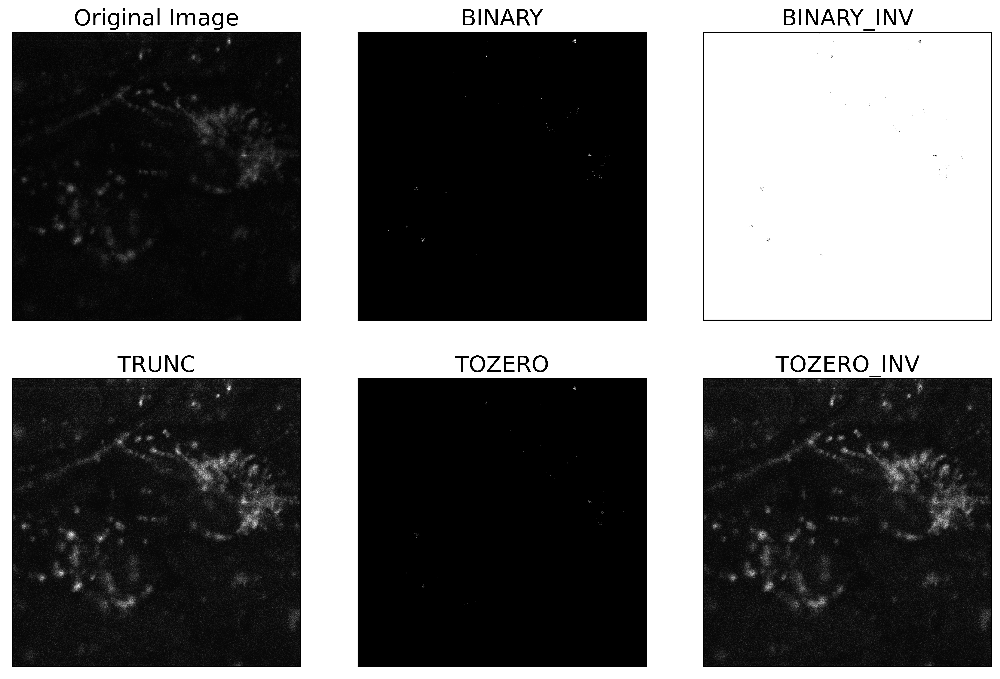

In [2]:
ret, thresh1 = cv.threshold(img, 127, 255, cv.THRESH_BINARY)
ret, thresh2 = cv.threshold(img, 127, 255, cv.THRESH_BINARY_INV)
ret, thresh3 = cv.threshold(img, 127, 255, cv.THRESH_TRUNC)
ret, thresh4 = cv.threshold(img, 127, 255, cv.THRESH_TOZERO)
ret, thresh5 = cv.threshold(img, 127, 255, cv.THRESH_TOZERO_INV)

imageTitles = ['Original Image', 'BINARY', 'BINARY_INV', 'TRUNC', 'TOZERO', 'TOZERO_INV']
images = [img, thresh1, thresh2, thresh3, thresh4, thresh5]

plt.figure(1, figsize=FIG_SIZE, dpi=DPI)
for i in range(6):
    plt.subplot(2,3,i+1),plt.imshow(images[i],'gray')
    plt.title(imageTitles[i])
    plt.xticks([]),plt.yticks([])
plt.show()

---

### Adaptive Thresholding
The adaptiveMethod decides how the threshold value is calculated:

    cv.ADAPTIVE_THRESH_MEAN_C: The threshold value is the mean of the neighbourhood area minus the constant C.
    cv.ADAPTIVE_THRESH_GAUSSIAN_C: The threshold value is a gaussian-weighted sum of the neighbourhood values minus the constant C.


Note: This is one source of subjectivity in microscopy processing while entering the supervised **blockSize** and **C** constants.
-  **blockSize**: determines the size of the neighbourhood area
-  **C**: a constant that is subtracted from the mean or weighted sum of the neighbourhood pixels.


[[1 0 1 ... 0 4 2]
 [4 1 1 ... 0 1 0]
 [1 0 0 ... 0 2 3]
 ...
 [0 0 1 ... 2 0 0]
 [3 0 0 ... 0 0 0]
 [3 0 0 ... 2 1 0]]


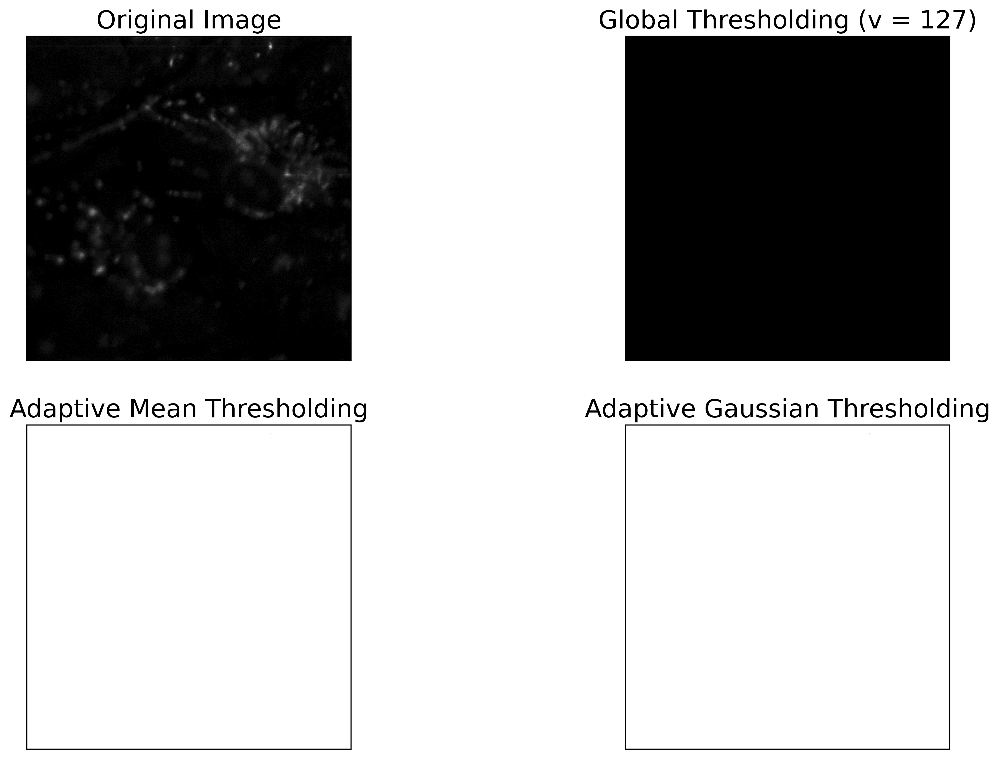

In [3]:
img = cv.imread(currentImage, cv.IMREAD_GRAYSCALE ) if currentImage != str(MITO_IMAGE) else cv.imread(currentImage, 0)
iar = np.asarray(img)
print(iar)

img = cv.medianBlur(img,5)

blockSize = 7
c_value = 4

ret,th1 = cv.threshold(img,127,255,cv.THRESH_BINARY)
th2 = cv.adaptiveThreshold(img,255,cv.ADAPTIVE_THRESH_MEAN_C, cv.THRESH_BINARY, blockSize, c_value)
th3 = cv.adaptiveThreshold(img,255,cv.ADAPTIVE_THRESH_GAUSSIAN_C, cv.THRESH_BINARY, blockSize, c_value)
titles = ['Original Image', 'Global Thresholding (v = 127)', 'Adaptive Mean Thresholding', 'Adaptive Gaussian Thresholding']
images = [img, th1, th2, th3]
plt.figure(1, figsize=FIG_SIZE, dpi=DPI)
for i in range(4):
    plt.subplot(2,2,i+1),plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])
plt.show()

### Otsu's Binarization

In global thresholding, we used an arbitrary chosen value as a threshold. In contrast, Otsu's method avoids having to choose a value and determines it automatically.

Consider an image with only two distinct image values (bimodal image), where the histogram would only consist of two peaks. A good threshold would be in the middle of those two values. Similarly, Otsu's method determines an optimal global threshold value from the image histogram.

In order to do so, the cv.threshold() function is used, where cv.THRESH_OTSU is passed as an extra flag. The threshold value can be chosen arbitrary. The algorithm then finds the optimal threshold value which is returned as the first output.



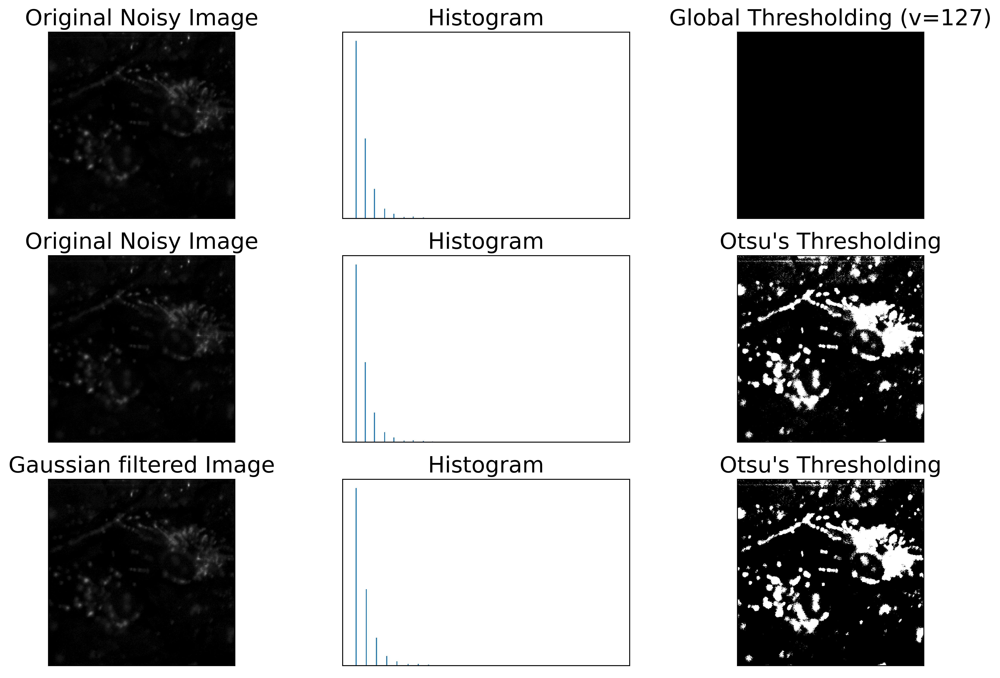

In [4]:
# global thresholding
ret1, th1 = cv.threshold(img, 127, 255, cv.THRESH_BINARY)

# Otsu's thresholding
ret2, th2 = cv.threshold(img, 0, 255, cv.THRESH_BINARY+cv.THRESH_OTSU)

# Otsu's thresholding after Gaussian filtering
blur = cv.GaussianBlur(img, (5, 5), 0)
ret3, th3 = cv.threshold(blur, 0, 255, cv.THRESH_BINARY+cv.THRESH_OTSU)

# plot all the images and their histograms
images = [img, 0, th1,
          img, 0, th2,
          blur, 0, th3]
titles = ['Original Noisy Image','Histogram','Global Thresholding (v=127)',
          'Original Noisy Image','Histogram',"Otsu's Thresholding",
          'Gaussian filtered Image','Histogram',"Otsu's Thresholding"]
plt.figure(1, figsize=FIG_SIZE, dpi=DPI)
for i in range(3):
    plt.subplot(3,3,i*3+1),plt.imshow(images[i*3],'gray')
    plt.title(titles[i*3]), plt.xticks([]), plt.yticks([])
    plt.subplot(3,3,i*3+2),plt.hist(images[i*3].ravel(),256)
    plt.title(titles[i*3+1]), plt.xticks([]), plt.yticks([])
    plt.subplot(3,3,i*3+3),plt.imshow(images[i*3+2],'gray')
    plt.title(titles[i*3+2]), plt.xticks([]), plt.yticks([])
plt.show()

Working with bimodal images, Otsu's algorithm tries to find a threshold value (t) which minimizes the weighted within-class variance given by the relation:

\begin{align*}
σ2w(t)=q1(t)σ21(t)+q2(t)σ22(t) \\ \; \\
where \\ 
q1(t)=∑i=1tP(i)&q2(t)=∑i=t+1IP(i) \\ \; \\
μ1(t)=∑i=1tiP(i)q1(t)&μ2(t)=∑i=t+1IiP(i)q2(t) \\ \; \\
σ21(t)=∑i=1t[i−μ1(t)]2P(i)q1(t)&σ22(t)=∑i=t+1I[i−μ2(t)]2P(i)q2(t) \\ \; \\
\end{align*}

It actually finds a value of t which lies in between two peaks such that variances to both classes are minimal.

22 1.0


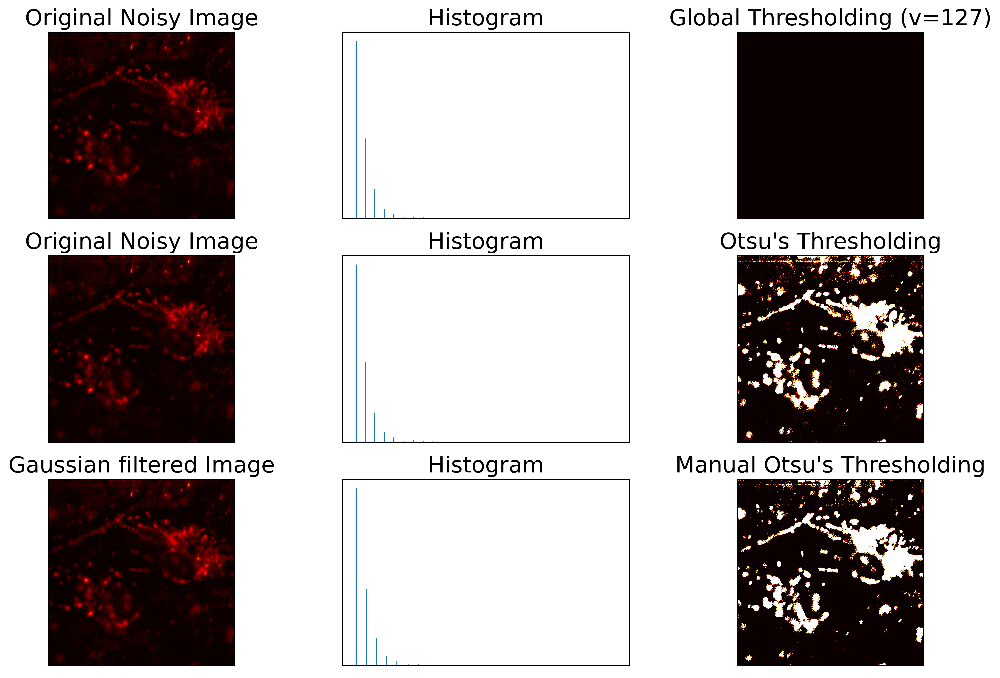

In [5]:
# find normalized_histogram, and its cumulative distriution function
hist = cv.calcHist([blur], [0], None, [256], [0, 256])
hist_norm = hist.ravel()/hist.sum()
Q = hist_norm.cumsum()

bins = np.arange(256)

fn_min = np.inf
thresh = -1

for i in range(1, 256):
    p1,p2 = np.hsplit(hist_norm, [i]) # probabilities
    q1,q2 = Q[i], Q[255]-Q[i] # cum sum of classes
    if q1 < 1.e-6 or q2 < 1.e-6:
        continue
    b1,b2 = np.hsplit(bins, [i]) # weights
    
    # finding means and variances
    m1,m2 = np.sum(p1*b1)/q1, np.sum(p2*b2)/q2
    v1,v2 = np.sum(((b1-m1)**2)*p1)/q1, np.sum((b2-m2)**2)/q2
    
    # calculates the minimization function
    fn = v1*q1 + v2*q2
    if fn < fn_min:
        fn_min = fn
        thresh = i

# find otsu's threshold value with OpenCV function
ret, otsu = cv.threshold(blur, 0, 255, cv.THRESH_BINARY+cv.THRESH_OTSU)
print( "{} {}".format(thresh, ret))

# plot all the images and their histograms
images = [img, 0, th1,
          img, 0, th2,
          blur, 0, otsu]
titles = ['Original Noisy Image','Histogram','Global Thresholding (v=127)',
          'Original Noisy Image','Histogram',"Otsu's Thresholding",
          'Gaussian filtered Image','Histogram',"Manual Otsu's Thresholding"]
plt.figure(1, figsize=FIG_SIZE, dpi=DPI)
for i in range(3):
    plt.subplot(3,3,i*3+1),plt.imshow(images[i*3],'hot')
    plt.title(titles[i*3]), plt.xticks([]), plt.yticks([])
    plt.subplot(3,3,i*3+2),plt.hist(images[i*3].ravel(),256)
    plt.title(titles[i*3+1]), plt.xticks([]), plt.yticks([])
    plt.subplot(3,3,i*3+3),plt.imshow(images[i*3+2],'hot')
    plt.title(titles[i*3+2]), plt.xticks([]), plt.yticks([])
# plt.savefig('otsu_fig.png', transparent=True, DPI=1200)
plt.show()

#### Another great segmentation algorithm that can be used alongside Otsu's binarization is Watershed Segmentation

In [8]:
#constants
resultsPath = r'G:\My Drive\Harvard\Ophthalmology Research\Software\Python\Microscopy_Deep_Learning_Essential_Recipes\app\features\processing\results'
print(os.listdir(resultsPath))

mitoImage = cv.imread(str(MITO_IMAGE))
gray = cv.cvtColor(mitoImage, cv.COLOR_BGR2GRAY)
ret, mitoThresholded = cv.threshold(gray, 0, 255, cv.THRESH_BINARY_INV+cv.THRESH_OTSU)

plt.figure(1, figsize=FIG_SIZE, dpi=DPI)
plt.subplot(1, 2, 1), plt.imshow(mitoImage, cmap='gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(1, 2, 2), plt.imshow(mitoThresholded, cmap='gray')
plt.title('Watershed Segmented Image'), plt.xticks([]), plt.yticks([])
plt.show()

# save the image back to file
os.chdir(resultsPath)
cv.imwrite('original_mito.png', mitoImage)
cv.imwrite('watershed_thresholded_mito.png', mitoThresholded)


['otsu_fig.png', 'canny_edge_detection.png', 'watershed_thresholded_mito.png', 'original_mito.png']


error: OpenCV(4.2.0) C:\projects\opencv-python\opencv\modules\imgproc\src\color.cpp:182: error: (-215:Assertion failed) !_src.empty() in function 'cv::cvtColor'


In [ ]:
colors = np.array(plt.get_cmap())
colors.shape
print(colors)
